# Ross Sea synthetic gravity inversion

import packages

In [2]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import logging
import os
import pathlib
import pickle
import string
import copy
import numpy as np
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles, fetch
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, optimization, plotting, regional, uncertainty, utils

# Get synthetic model data

INFO:root:converting to be reference to the WGS84 ellipsoid
INFO:root:spacing larger than original, filtering and resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


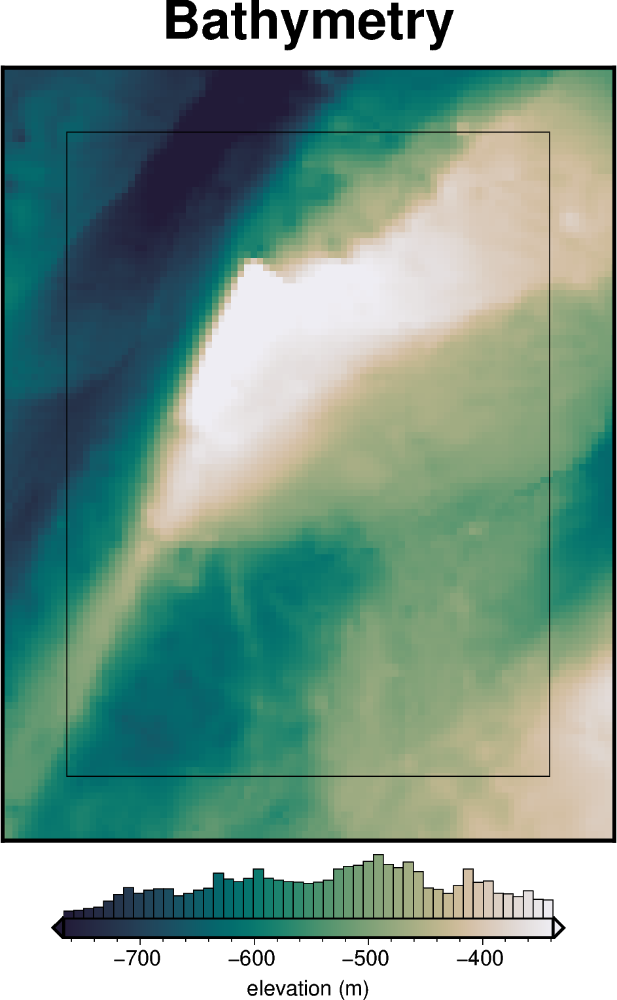

  0%|          | 0/7676 [00:00<?, ?it/s]

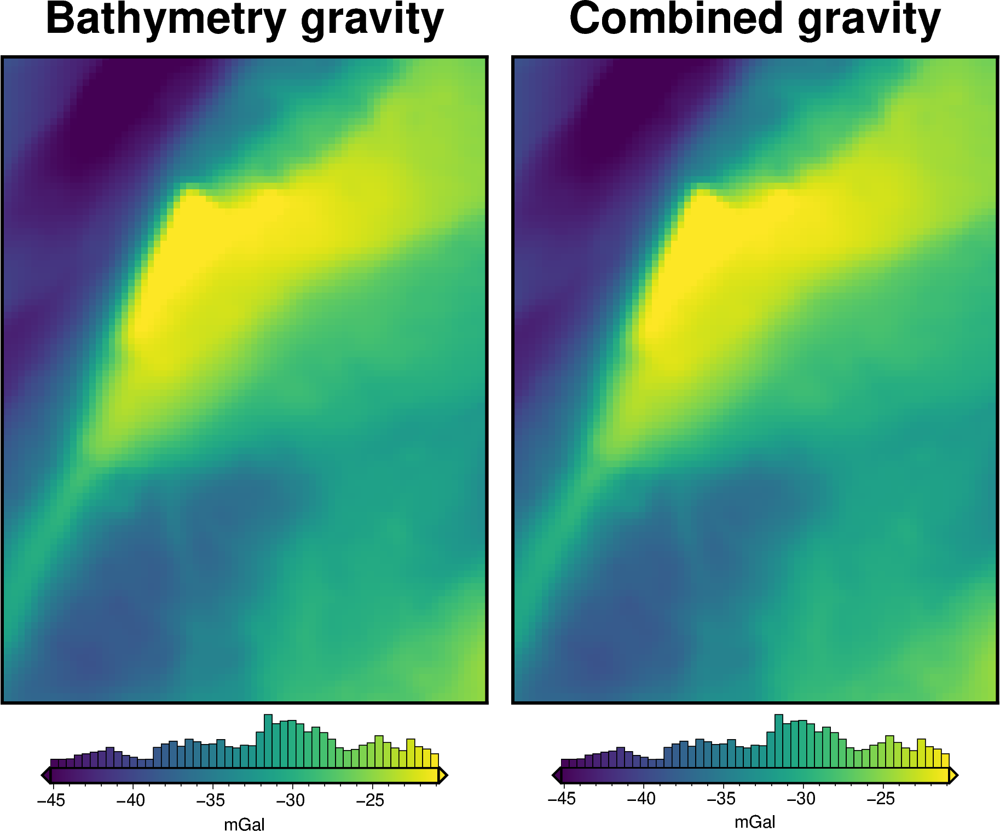

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

# rename the full res gravity column
grav_df = grav_df.rename(columns={"gravity_anomaly": "gravity_anomaly_full_res"})

In [4]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032


## Create synthetic airborne survey

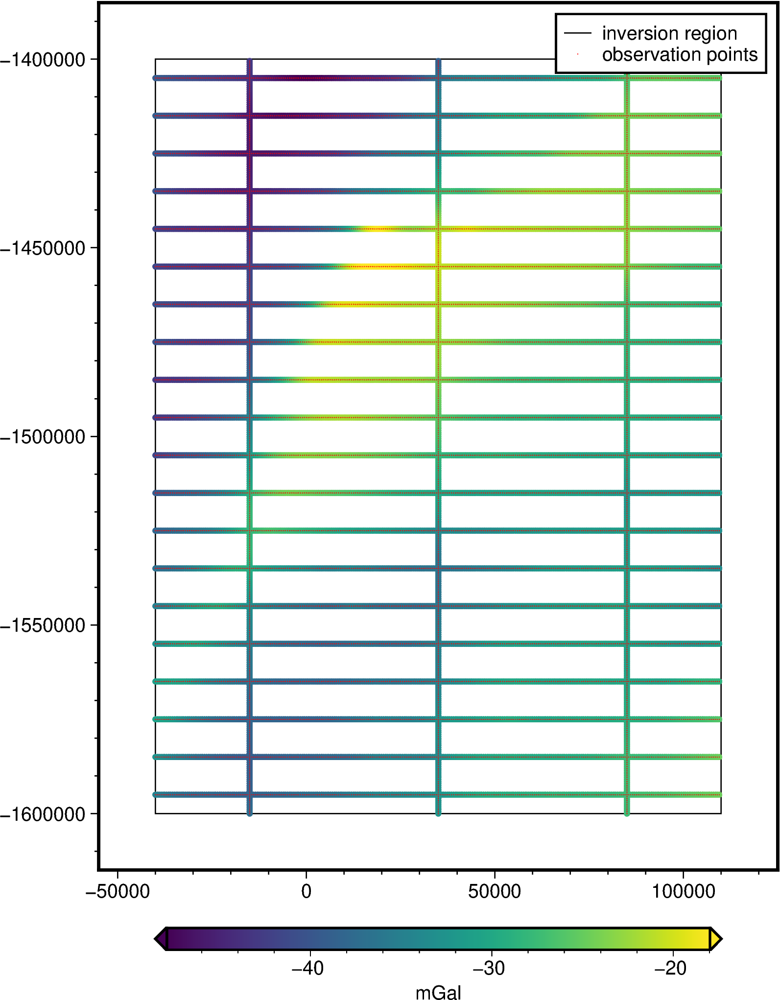

,northing,easting,upward,line,time,geometry,dist_along_line,gravity_anomaly
0,-1600000.0,-15000.0,1000.0,1000.0,0.0,POINT (-15000.000 -1600000.000),0.0,-37.186828
1,-1600000.0,35000.0,1000.0,1010.0,0.0,POINT (35000.000 -1600000.000),0.0,-32.340126
2,-1600000.0,85000.0,1000.0,1020.0,0.0,POINT (85000.000 -1600000.000),0.0,-27.510143
3,-1599500.0,-15000.0,1000.0,1000.0,1.0,POINT (-15000.000 -1599500.000),500.0,-37.302445
4,-1599500.0,35000.0,1000.0,1010.0,1.0,POINT (35000.000 -1599500.000),500.0,-32.358606
...,...,...,...,...,...,...,...,...
5995,-1405000.0,107500.0,1000.0,29.0,295.0,POINT (107500.000 -1405000.000),147500.0,-25.739013
5996,-1405000.0,108000.0,1000.0,29.0,296.0,POINT (108000.000 -1405000.000),148000.0,-25.748488
5997,-1405000.0,108500.0,1000.0,29.0,297.0,POINT (108500.000 -1405000.000),148500.0,-25.754635
5998,-1405000.0,109000.0,1000.0,29.0,298.0,POINT (109000.000 -1405000.000),149000.0,-25.757270


In [5]:
grav_survey_df = RIS_synth.airborne_survey(
    along_line_spacing=500,
    grav_observation_height=1e3,
    NS_line_spacing=50e3,
    EW_line_spacing=10e3,
    region=inversion_region,
    grav_grid=grav_df.set_index(
        ["northing", "easting"]
    ).gravity_anomaly_full_res.to_xarray(),
    plot=True,
)
grav_survey_df

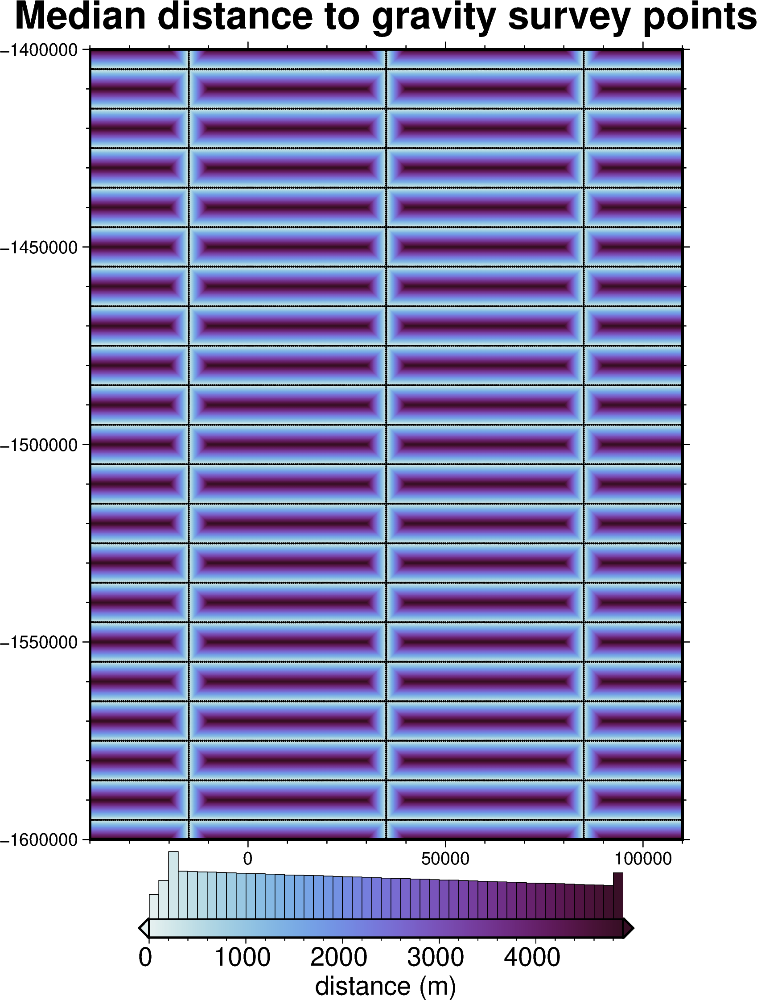

mean minimum distance: 2344 m
median minimum distance: 2300 m


In [6]:
# calculate gravity data median distance
grd = bathymetry.sel(easting=slice(*inversion_region[:2]), northing=slice(*inversion_region[2:]))

grd = fetch.resample_grid(grd, spacing=100, verbose="q").rename({"x": "easting", "y": "northing"})

min_dist = utils.dist_nearest_points(
    grav_survey_df,
    grd,
).min_dist

fig = maps.plot_grd(
    min_dist,
    title="Median distance to gravity survey points",
    cbar_label="distance (m)",
    cbar_font="18p,Helvetica,black",
    cmap="dense",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cpt_lims=[0,polar_utils.get_min_max(min_dist, robust=True,)[1]],
    points=grav_survey_df,
    points_style="p1p",
    points_fill="black",
)
fig.show()
print(f"mean minimum distance: {int(min_dist.mean().values)} m")
print(f"median minimum distance: {int(min_dist.median().values)} m")

In [7]:
# save to csv
grav_survey_df.to_csv("../../results/Ross_Sea_05_grav_survey_df.csv", index=False)

In [8]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

eq_study, eqs = optimization.optimize_eq_source_params(
    coords,
    data,
    n_trials=12,
    damping_limits=(1e-10, 10),
    depth_limits=(100, 100e3),
    # damping=None,
    # depth="default",
    block_size=spacing,
    plot=True,
    fname="../../results/Ross_Sea_05_eq_sources",
)

INFO:invert4geom:using 8 startup trials


  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'depth': 9414.437721470877, 'damping': 0.0026774955005855502}
INFO:invert4geom:	scores: [0.9999868994282686]


In [9]:
# predict sources onto grid
grav_df["eqs_gravity_anomaly"] = eqs.predict(
    (
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,  # either grav_df.upward or user-set constant value
    ),
)

grav_df["gravity_anomaly"] = grav_df.eqs_gravity_anomaly
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041,-33.102439,-33.102439
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652,-33.823756,-33.823756
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148,-34.398028,-34.398028
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612,-34.861695,-34.861695
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032,-35.219312,-35.219312
...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0,-25.760380,-25.760380,-24.774859,-24.774859
7672,-1400000.0,104000.0,1000.0,-25.911731,0,-25.911731,-25.911731,-24.770341,-24.770341
7673,-1400000.0,106000.0,1000.0,-26.033127,0,-26.033127,-26.033127,-24.755321,-24.755321
7674,-1400000.0,108000.0,1000.0,-26.122232,0,-26.122232,-26.122232,-24.685862,-24.685862


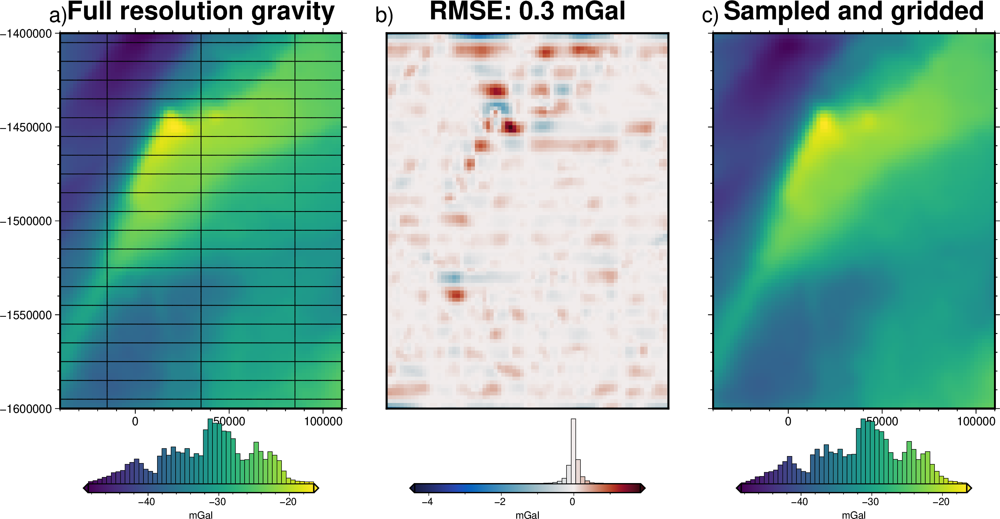

In [10]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# plot the synthetic gravity anomaly grid
lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res)

fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Full resolution gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = grav_grid.gravity_anomaly_full_res - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    title=f"RMSE: {round(utils.rmse(dif),2)} mGal",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Sampled and gridded",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.show()

# Make starting bathymetry model

In [11]:
# semi-regularly spaced
constraint_points = RIS_synth.constraint_layout_number(
    shape=(4, 5),
    region=inversion_region,
    padding=-spacing,
    shapefile="../../data/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,inside,true_upward,upward
0,-1600000.0,-40000.0,False,-601.093811,-601.093811
1,-1600000.0,-38000.0,False,-609.216797,-609.216797
2,-1600000.0,-36000.0,False,-616.356018,-616.356018
3,-1600000.0,-34000.0,False,-621.262207,-621.262207
4,-1600000.0,-32000.0,False,-625.510864,-625.510864


In [12]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)

starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-540.85324708, -544.21519109, -547.59855677, ..., -359.77829766,
        -356.84097116, -353.9671395 ],
       [-542.96903012, -546.47710941, -550.04617896, ..., -362.70499047,
        -359.76544554, -356.90451862],
       [-544.69488138, -548.33638995, -552.08554336, ..., -365.48679147,
        -362.55156299, -359.71215141],
       ...,
       [-591.97428035, -595.54194913, -599.09350427, ..., -440.93897354,
        -440.74704981, -440.46522382],
       [-590.54905826, -594.11158059, -597.66425625, ..., -440.7362303 ,
        -440.47619558, -440.129527  ],
       [-589.18119782, -592.75387759, -596.32448457, ..., -440.56111512,
        -440.22075739, -439.79986662]])
Coordinates:
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [13]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.01 m


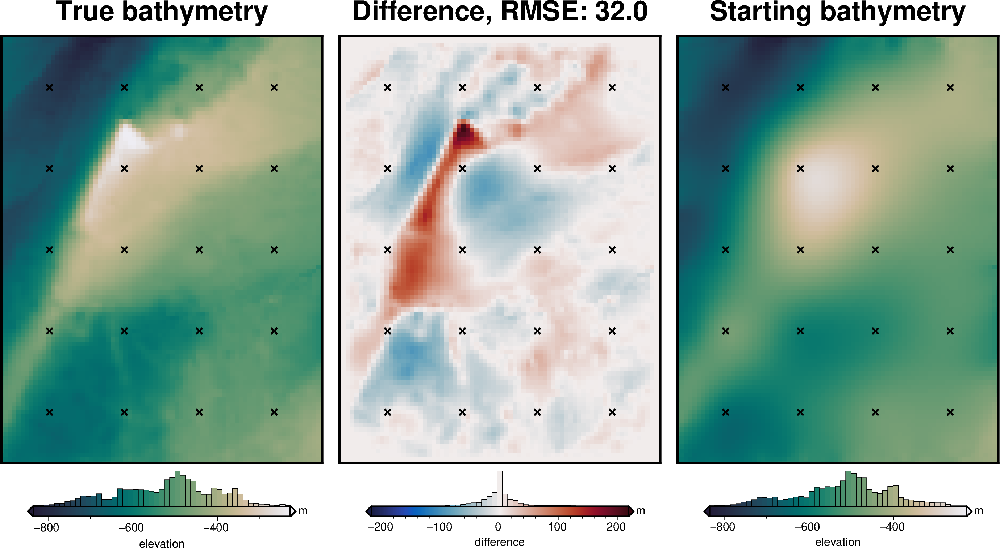

In [14]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [15]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041,-33.102439,-33.102439,-32.531726
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652,-33.823756,-33.823756,-32.955392
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148,-34.398028,-34.398028,-33.336163
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612,-34.861695,-34.861695,-33.631767
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032,-35.219312,-35.219312,-33.825918
...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0,-25.760380,-25.760380,-24.774859,-24.774859,-23.326855
7672,-1400000.0,104000.0,1000.0,-25.911731,0,-25.911731,-25.911731,-24.770341,-24.770341,-23.487013
7673,-1400000.0,106000.0,1000.0,-26.033127,0,-26.033127,-26.033127,-24.755321,-24.755321,-23.610099
7674,-1400000.0,108000.0,1000.0,-26.122232,0,-26.122232,-26.122232,-24.685862,-24.685862,-23.697322


In [16]:
regional_grav_kwargs = dict(
    method="constant",
    # constant=0,
    constraints_df=constraint_points,
)

In [17]:

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

grav_df

INFO:invert4geom:using median gravity misfit of constraint points for regional field: -2.6367872953414917 mGal


,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,misfit,reg,res
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041,-33.102439,-33.102439,-32.531726,-0.570714,-2.636787,2.066074
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652,-33.823756,-33.823756,-32.955392,-0.868364,-2.636787,1.768423
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148,-34.398028,-34.398028,-33.336163,-1.061864,-2.636787,1.574923
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612,-34.861695,-34.861695,-33.631767,-1.229928,-2.636787,1.406859
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032,-35.219312,-35.219312,-33.825918,-1.393394,-2.636787,1.243393
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0,-25.760380,-25.760380,-24.774859,-24.774859,-23.326855,-1.448004,-2.636787,1.188784
7672,-1400000.0,104000.0,1000.0,-25.911731,0,-25.911731,-25.911731,-24.770341,-24.770341,-23.487013,-1.283328,-2.636787,1.353459
7673,-1400000.0,106000.0,1000.0,-26.033127,0,-26.033127,-26.033127,-24.755321,-24.755321,-23.610099,-1.145222,-2.636787,1.491566
7674,-1400000.0,108000.0,1000.0,-26.122232,0,-26.122232,-26.122232,-24.685862,-24.685862,-23.697322,-0.988541,-2.636787,1.648247


makecpt [ERROR]: Option T: min >= max


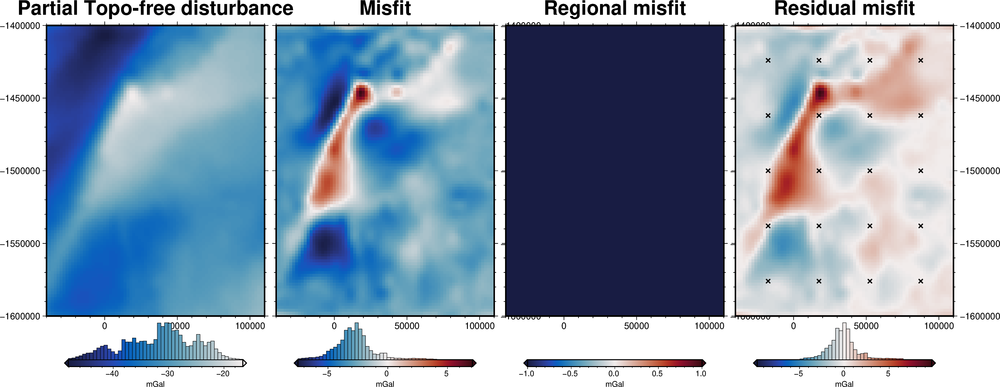

In [18]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [19]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

# Damping Cross Validation

In [18]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    # plot_cv=True,
    fname="../../results/Ross_Sea_05_damping_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../../results/Ross_Sea_05_damping_cv'
INFO:invert4geom:running damping cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'damping': 0.013132000327650065}
INFO:invert4geom:	scores: [0.021346785115762577]
INFO:invert4geom:results saved to ../../results/Ross_Sea_05_damping_cv_results.pickle.pickle


In [20]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_05_damping_cv_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_05_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [21]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.013132000327650065

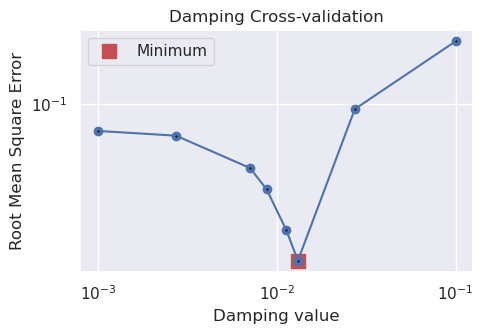

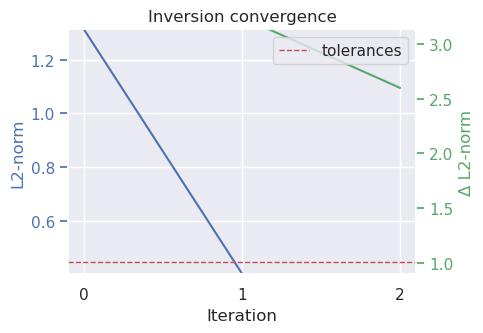

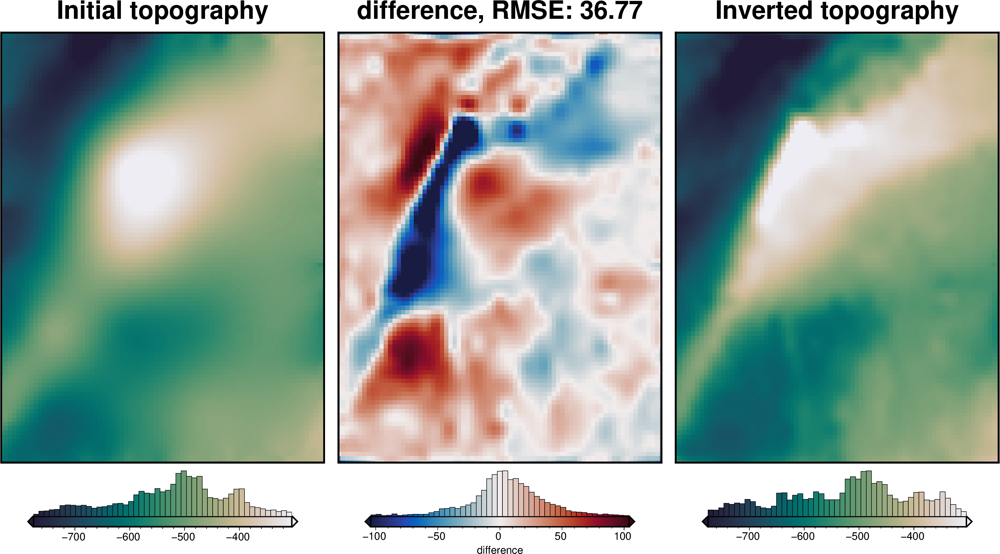

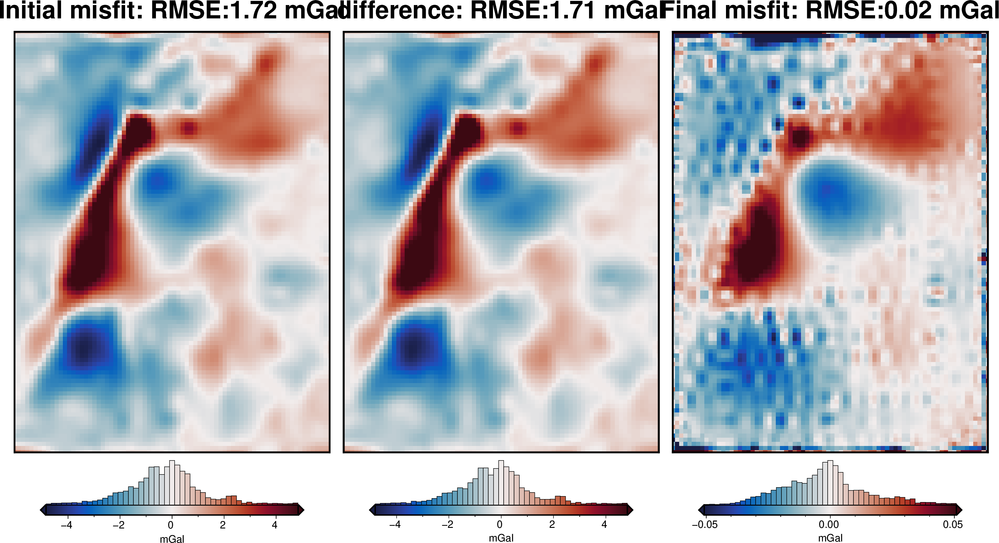

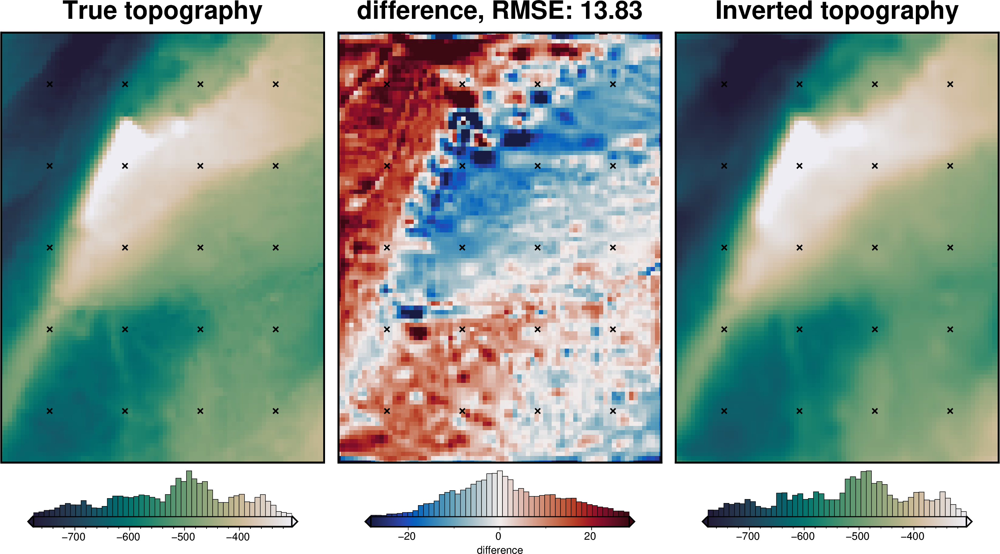

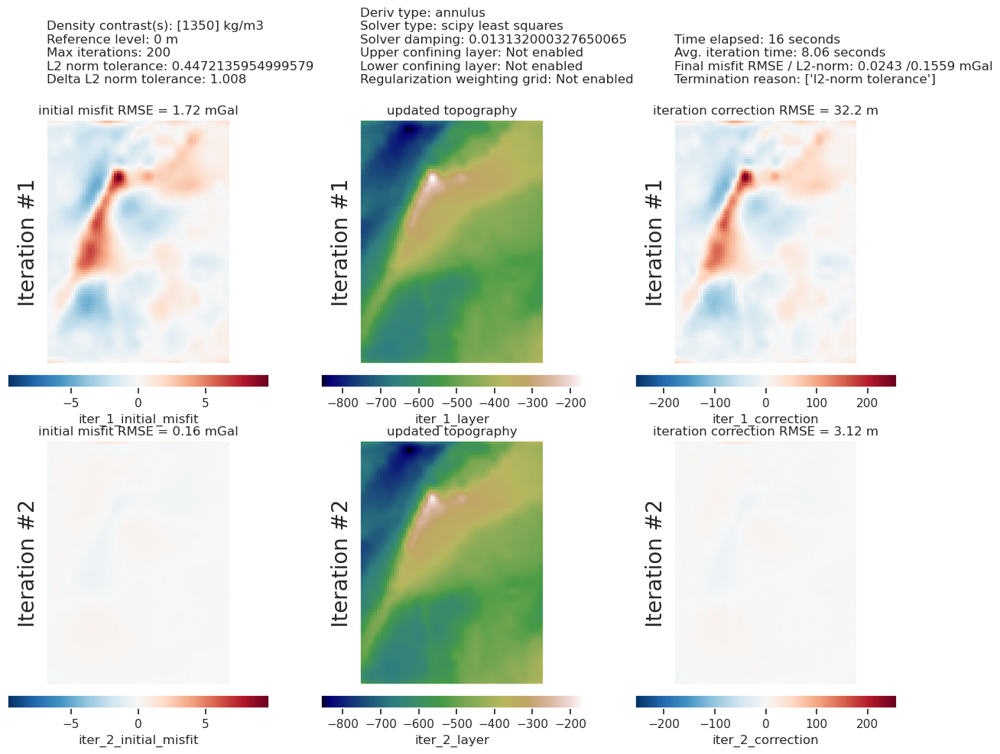

In [22]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [23]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 21.10 m


# Density CV

In [23]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_topography=starting_bathymetry,
    zref=0,
    calculate_regional_misfit=True,
    regional_grav_kwargs=dict(
        grav_df=grav_df,
        method="constant",
        constant=0,
    ),
    run_zref_or_density_cv=True,
    constraints_df=constraint_points,
    density_contrast_limits=(1300, 1600),
    zref_density_cv_trials=10,
    # plot_cv=True,
    fname="../../results/Ross_Sea_05_density_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../../results/Ross_Sea_05_density_cv'
INFO:invert4geom:running zref and/or density contrast cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 5
INFO:invert4geom:	parameter: {'density_contrast': 1459}
INFO:invert4geom:	scores: [20.129898554006598]
INFO:invert4geom:results saved to ../../results/Ross_Sea_05_density_cv_results.pickle


In [24]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_05_density_cv_results.pickle").open(
    "rb"
) as f:
   results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

# load study
with pathlib.Path(
    "../../results/Ross_Sea_05_density_cv_zref_density_cv_study.pickle"
).open("rb") as f:
    study = pickle.load(f)

In [25]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1459
real density contrast 1476


In [1]:
1476-1459

17

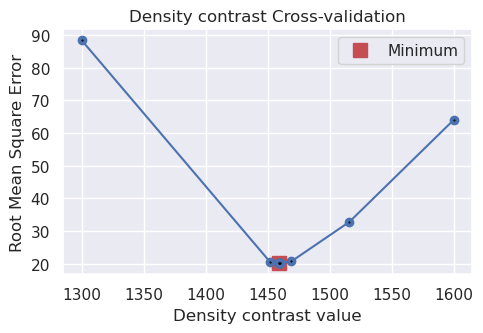

In [26]:
study_df = study.trials_dataframe()

fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_density_contrast,
    param_name="Density contrast",
)

### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [27]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

  0%|          | 0/7676 [00:00<?, ?it/s]

INFO:invert4geom:using median gravity misfit of constraint points for regional field: -0.33164021372795105 mGal


makecpt [ERROR]: Option T: min >= max


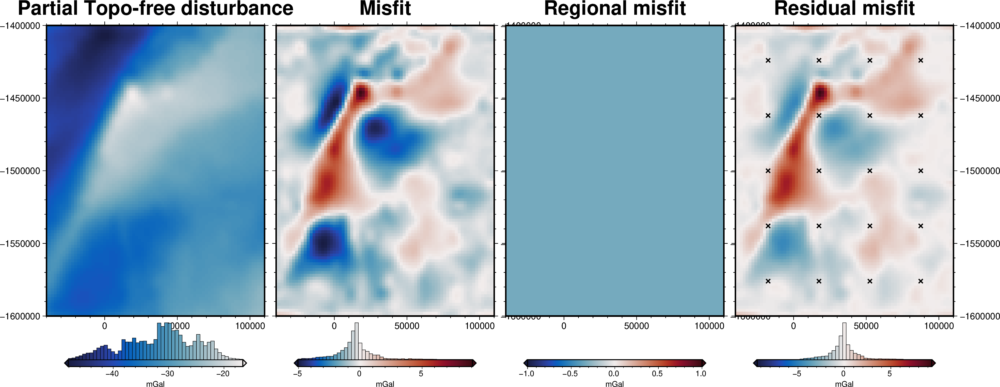

In [28]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

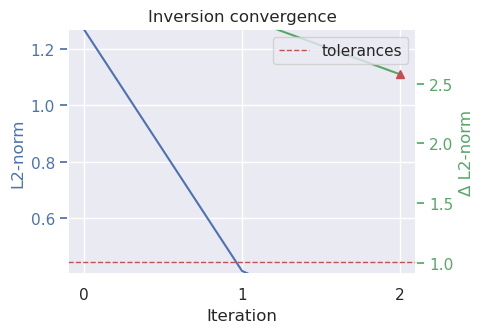

In [52]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname="../../results/Ross_Sea_05_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [29]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_05_optimal_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

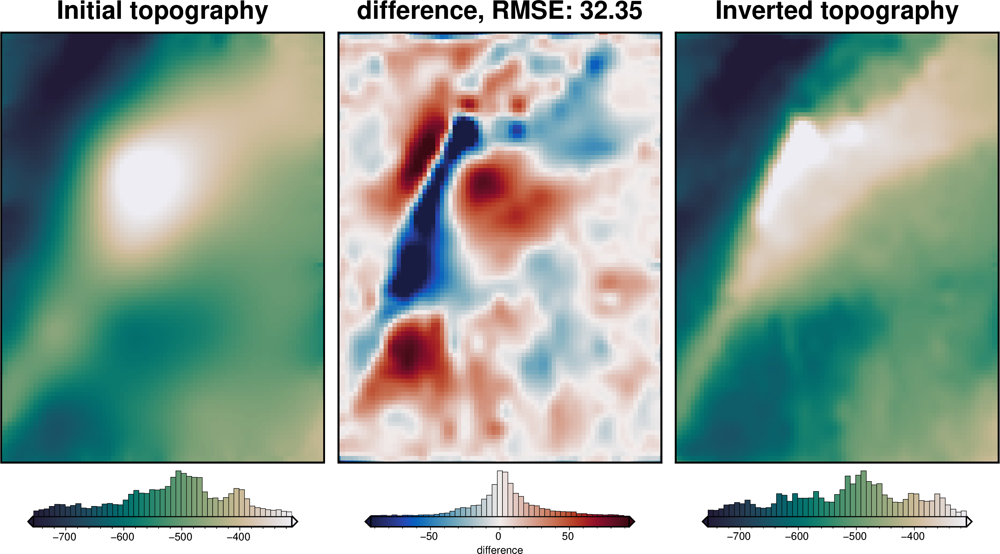

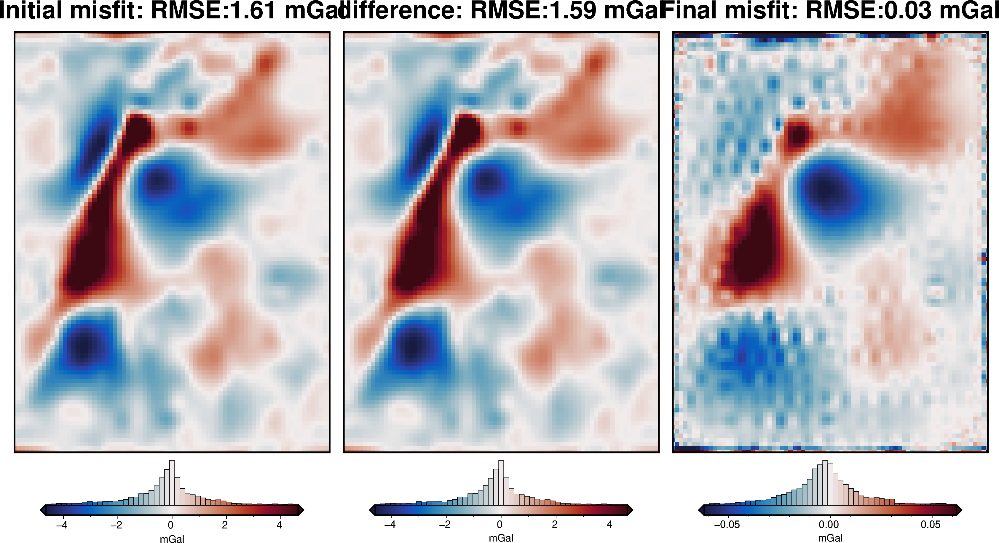

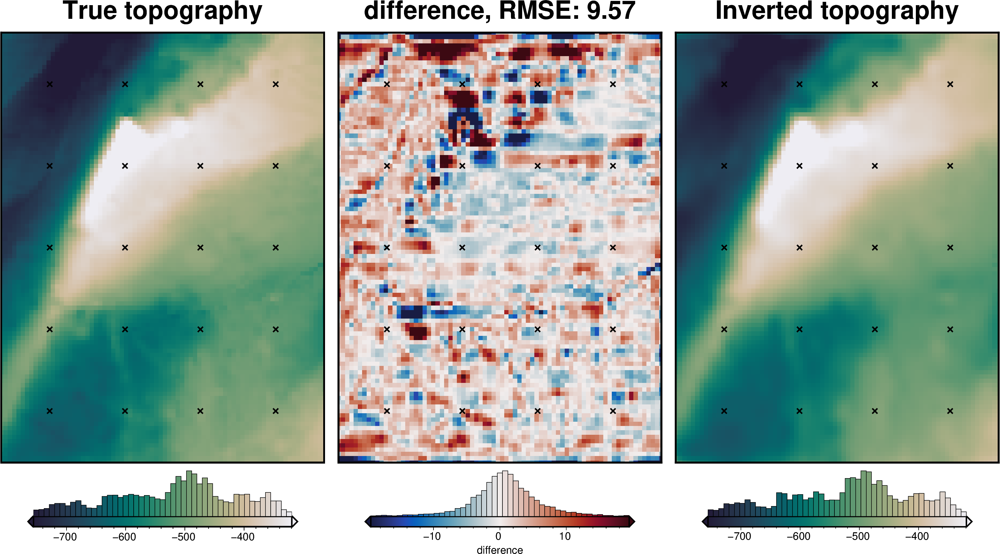

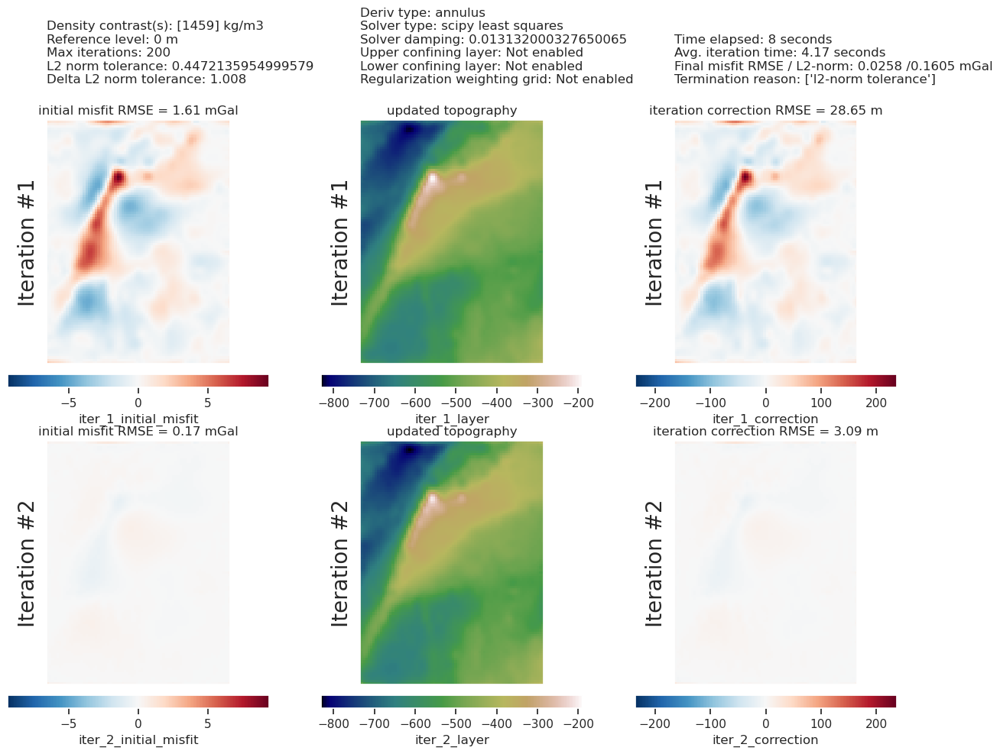

In [30]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [31]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 20.96 m


In [32]:
# save to csv
constraint_points.to_csv("../../results/Ross_Sea_05_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

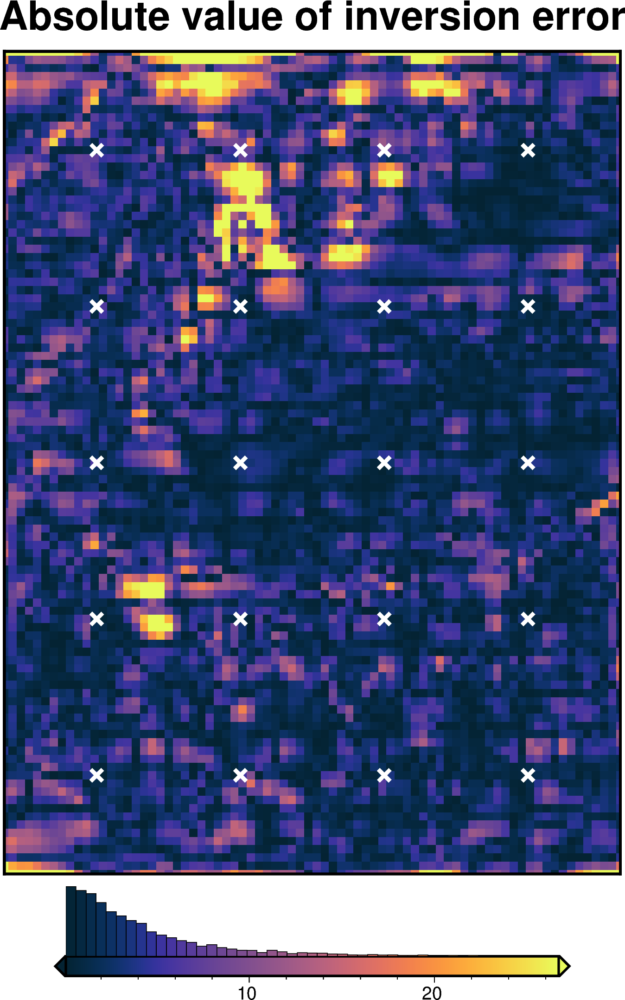

In [33]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=inversion_region,
    # region=vd.pad_region(inversion_region, -3*spacing),
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [34]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [35]:
# load study
with pathlib.Path("../../results/Ross_Sea_05_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev/4
print(f"using stdev: {stdev}")

calculated stdev: 0.4757030143458303
using stdev: 0.11892575358645757


best: 0.013132000327650065 
std: 0.11892575358645757 
+1std: 0.01726858046110632 
-1std: 0.00998631201874444


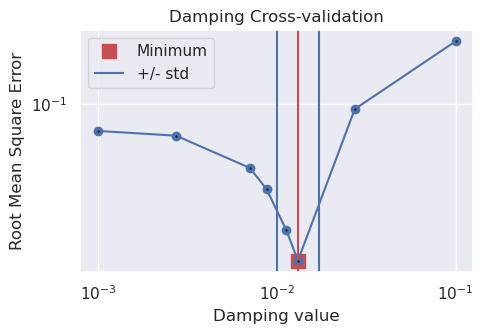

In [36]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.01357056176387289, min: 0.008369806693350072, max: 0.020603753339060372
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_05_uncertainty_damping' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_05_uncertainty_damping'



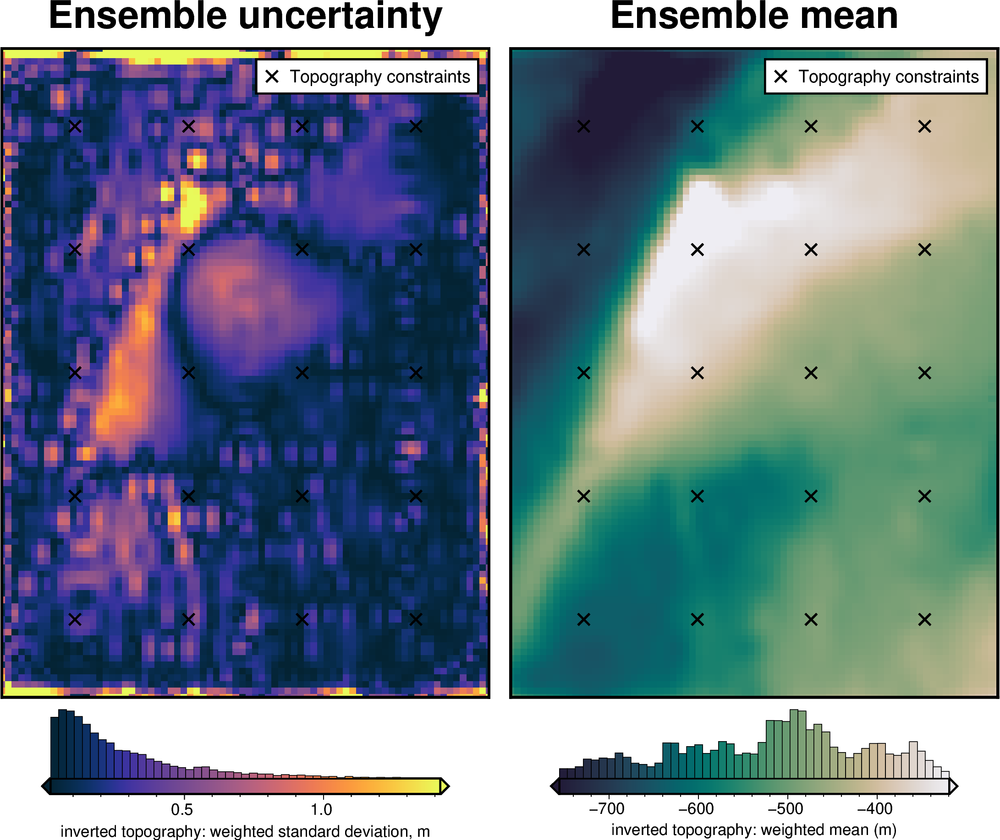

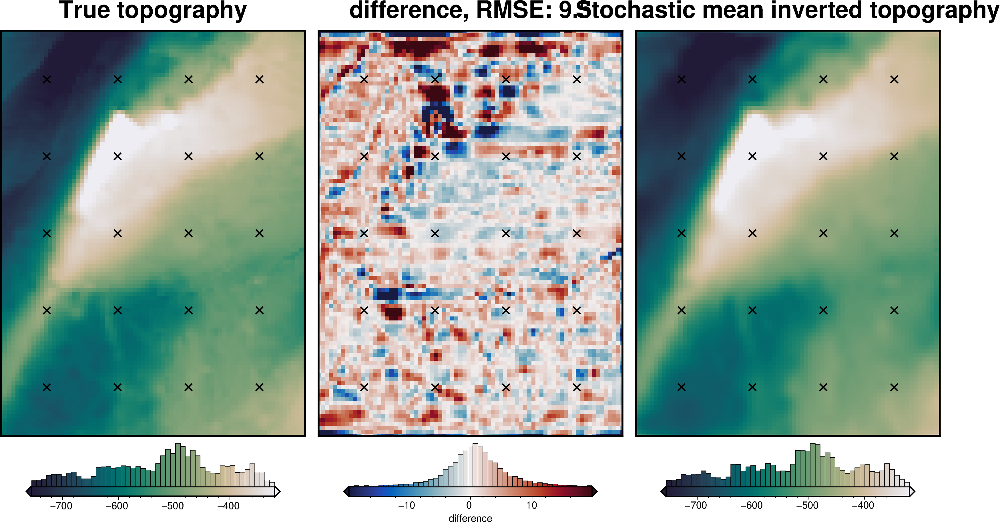

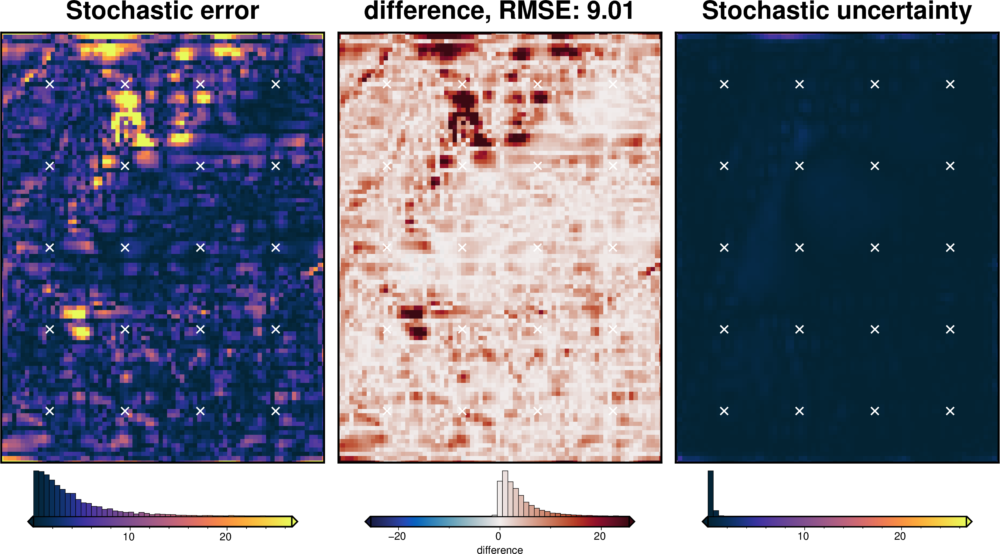

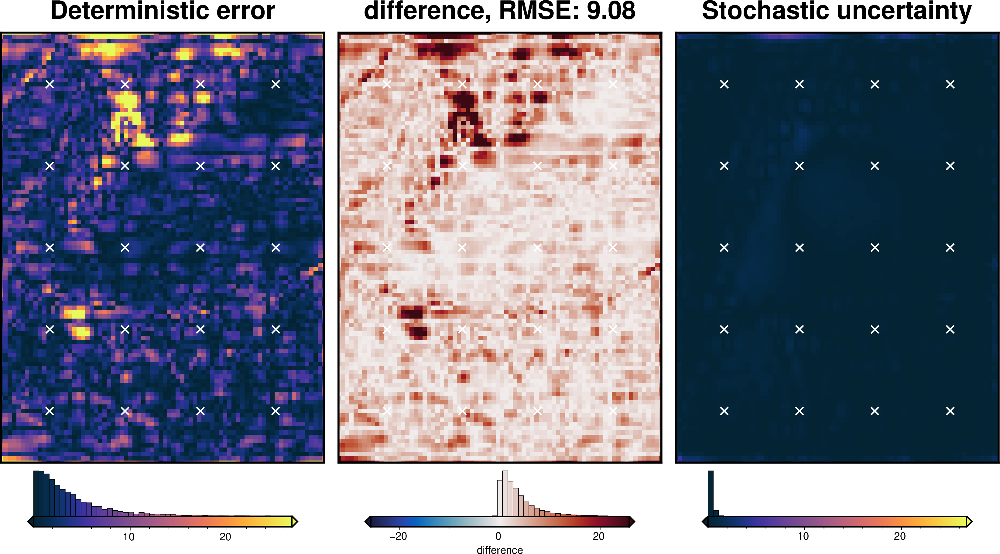

In [37]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = "../../results/Ross_Sea_05_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_damping_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [38]:
# load study
with pathlib.Path(
    "../../results/Ross_Sea_05_density_cv_zref_density_cv_study.pickle"
).open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 20
print(f"using stdev: {stdev}")

print(f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}")

calculated stdev: 48.35057163858332
using stdev: 20
density estimation error: 17


best: 1459 
std: 20 
+1std: 1479 
-1std: 1439


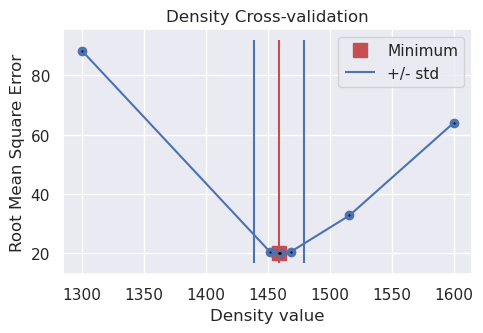

In [39]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1459.0, min: 1426.1029274609705, max: 1491.8970725390295
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_05_uncertainty_density' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_05_uncertainty_density'



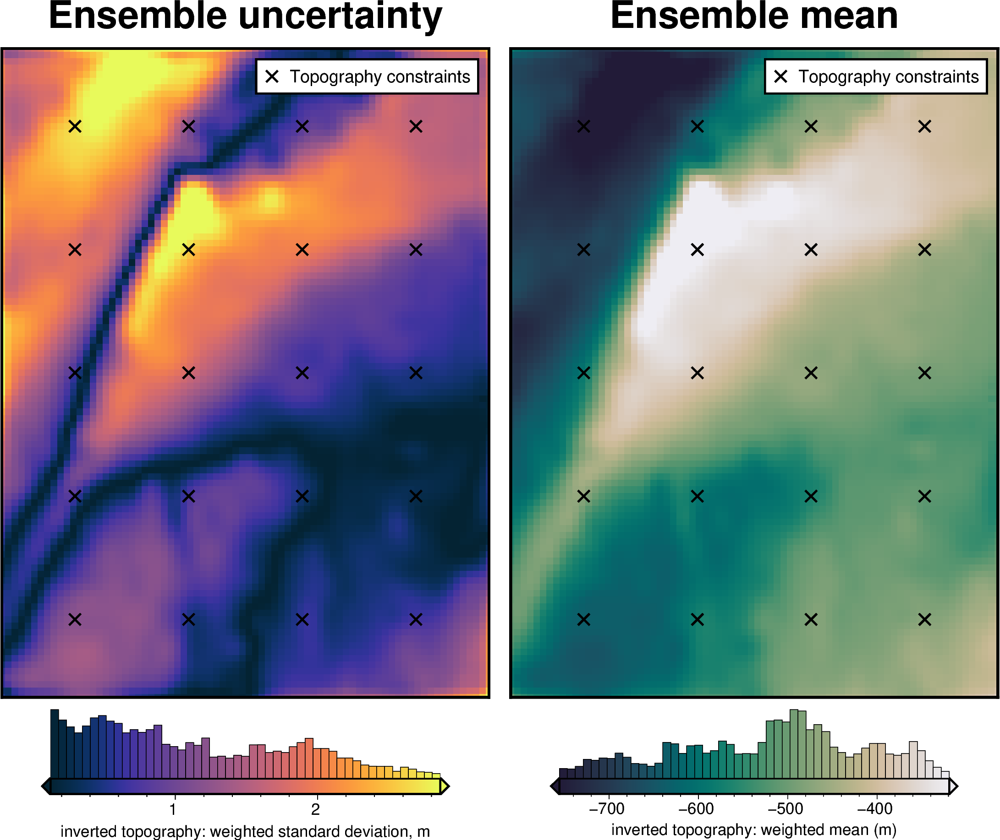

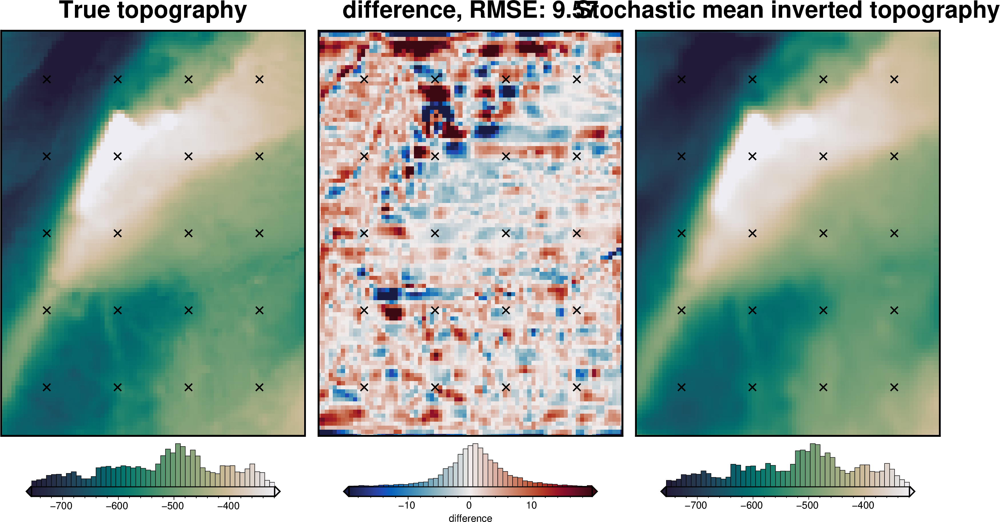

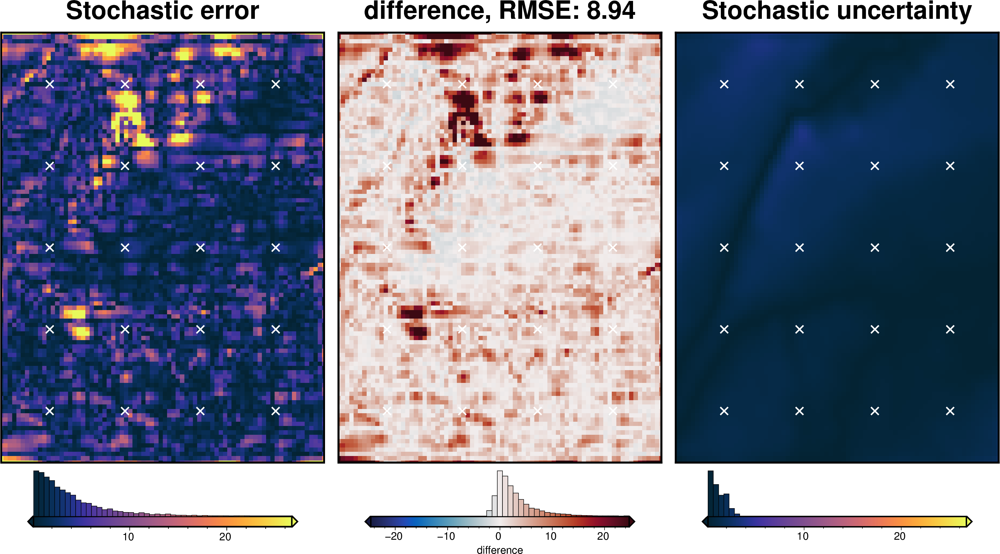

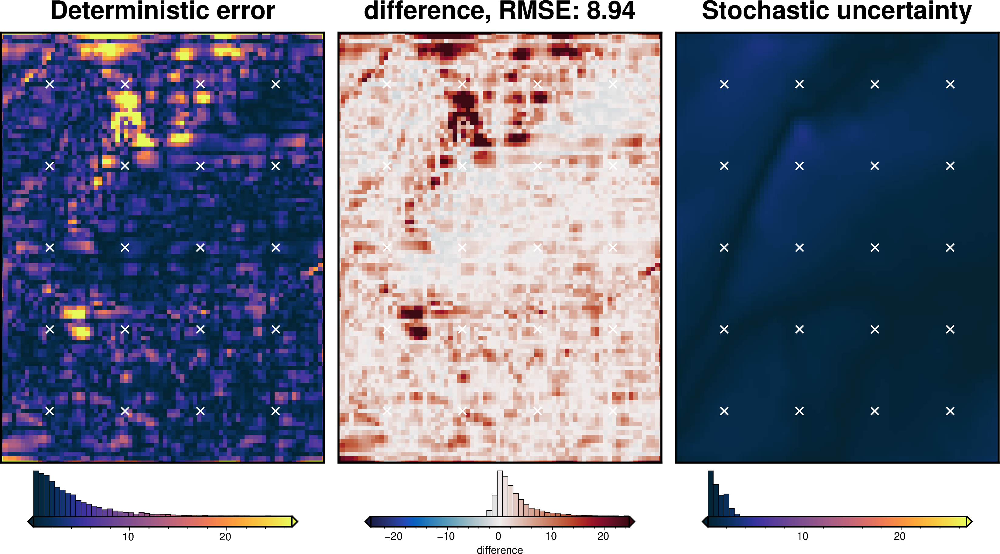

In [40]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = "../../results/Ross_Sea_05_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_density_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Equivalent source gridding component

In [41]:
eqs.depth, eqs.damping

(9414.437721470877, 0.0026774955005855502)

INFO:invert4geom:Sampled 'depth' parameter values; mean: 9414.437721470877, min: 5543.094713503344, max: 13285.780729438407
INFO:invert4geom:Sampled 'damping' parameter values; mean: 4.699599354439837, min: 1.572964981391653e-07, max: 45.57623494779409


starting equivalent sources ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

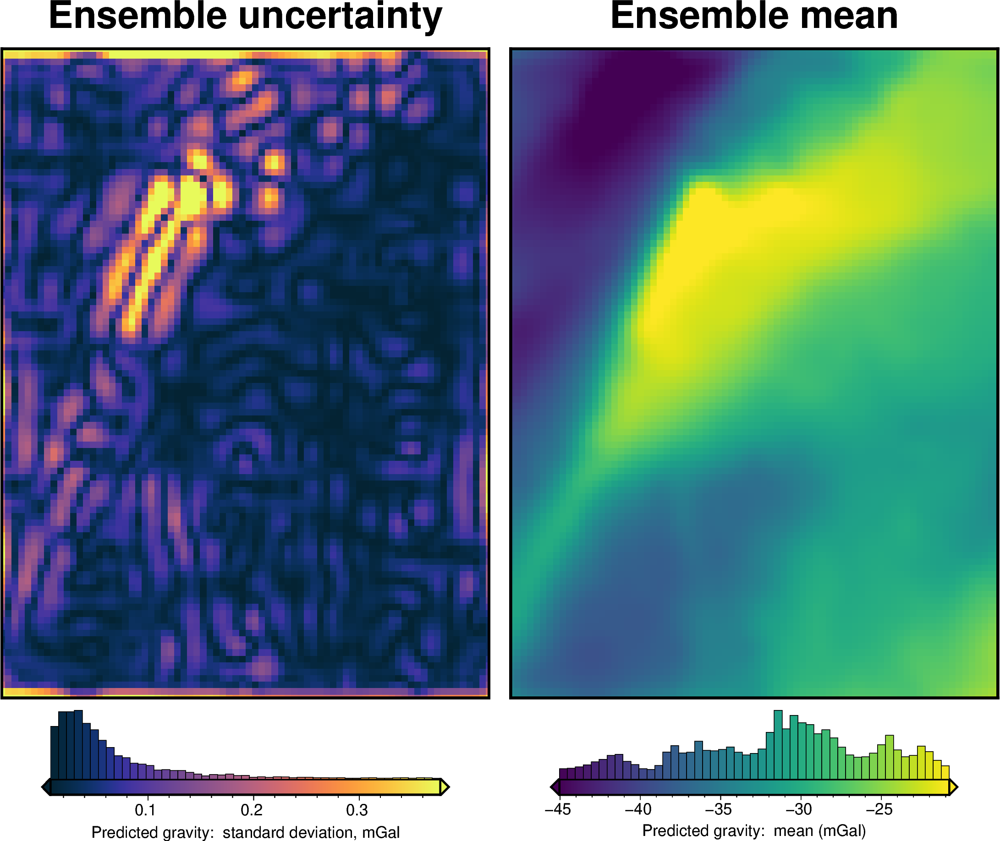

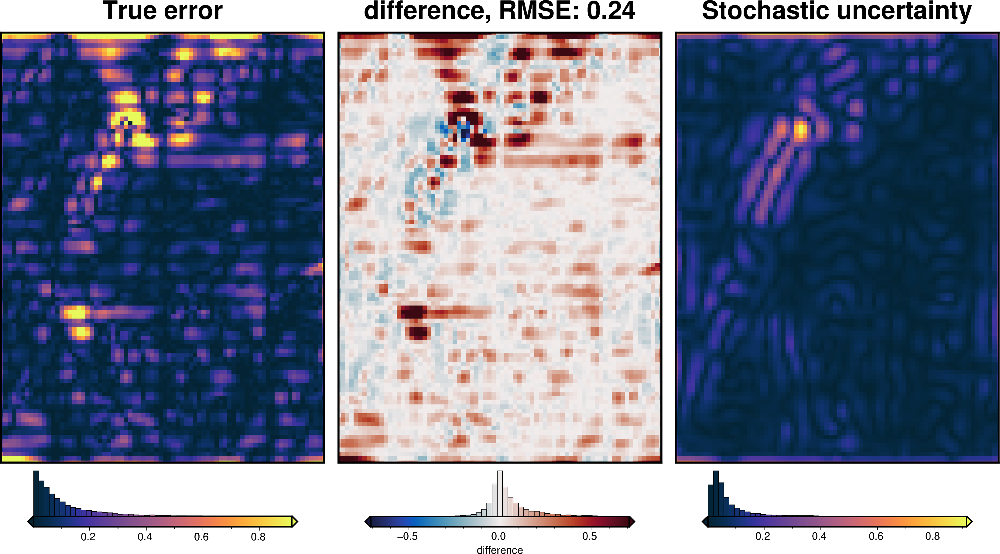

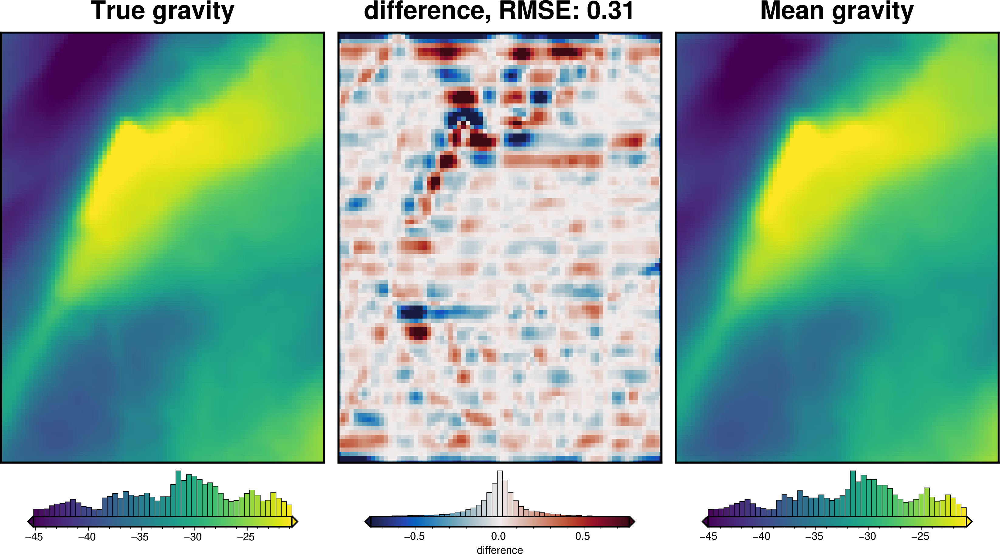

In [49]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

equivalent_source_parameter_dict = {
    "depth": {
        # "distribution": "uniform",
        # "loc": 2*min_dist,  # lower bound
        # "scale": 6*min_dist,  # range
        "distribution": "normal",
        "loc": eqs.depth,  # mean
        "scale": eqs.depth / 4,  # standard deviation
    },
    "damping": {
        "log": True,
        "distribution": "normal",
        "loc": np.log10(eqs.damping),  # mean of base 10 exponent, supply log10(value) here
        "scale": np.abs(np.log10(eqs.damping)),  # stdev of base 10 exponent, supply log10(value) here
    },
}

eqs_kwargs = dict(
    block_size=spacing,
    damping=eqs.damping,
    depth=eqs.depth
)
eqs_stats = uncertainty.equivalent_sources_uncertainty(
    runs=10,
    data=data,
    coords=coords,
    grid_points=grav_df,
    parameter_dict=equivalent_source_parameter_dict,
    # plot_region=vd.pad_region(inversion_region, -3*spacing),
    plot_region=inversion_region,
    true_gravity=grav_df.set_index(["northing", "easting"])
    .to_xarray()
    .gravity_anomaly_full_res,
    # weight_by="score",
    # weight_by="rmse",
    **eqs_kwargs,
)

In [50]:
grav_df = utils.sample_grids(
    grav_df,
    eqs_stats.z_stdev,
    sampled_name="eqs_uncert",
    coord_names=["easting", "northing"],
)
grav_df = utils.sample_grids(
    grav_df,
    eqs_stats.z_mean,
    sampled_name="gravity_anomaly_eqs_mean",
    coord_names=["easting", "northing"],
)
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,misfit,reg,res,predicted_grav,eqs_uncert,gravity_anomaly_eqs_mean
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041,-33.102439,-33.102439,-35.158361,2.055922,-0.33164,2.387562,-32.693592,0.703452,-32.903397
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652,-33.823756,-33.823756,-35.616235,1.792479,-0.33164,2.124119,-33.392168,0.647594,-33.656540
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148,-34.398028,-34.398028,-36.027750,1.629722,-0.33164,1.961362,-33.971461,0.631763,-34.254108
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612,-34.861695,-34.861695,-36.347221,1.485526,-0.33164,1.817166,-34.443688,0.623202,-34.726795
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032,-35.219312,-35.219312,-36.557048,1.337735,-0.33164,1.669376,-34.814304,0.604692,-35.087898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0,-25.760380,-25.760380,-24.774859,-24.774859,-25.210283,0.435424,-0.33164,0.767064,-24.566175,0.320028,-24.703007
7672,-1400000.0,104000.0,1000.0,-25.911731,0,-25.911731,-25.911731,-24.770341,-24.770341,-25.383372,0.613031,-0.33164,0.944671,-24.553304,0.339948,-24.695133
7673,-1400000.0,106000.0,1000.0,-26.033127,0,-26.033127,-26.033127,-24.755321,-24.755321,-25.516396,0.761075,-0.33164,1.092716,-24.521924,0.358363,-24.664846
7674,-1400000.0,108000.0,1000.0,-26.122232,0,-26.122232,-26.122232,-24.685862,-24.685862,-25.610661,0.924799,-0.33164,1.256439,-24.441260,0.392868,-24.565283


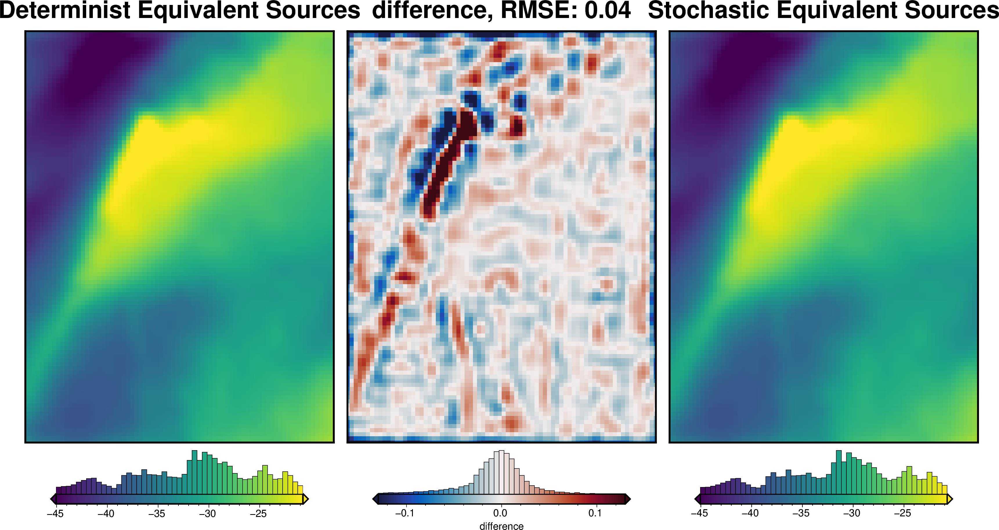

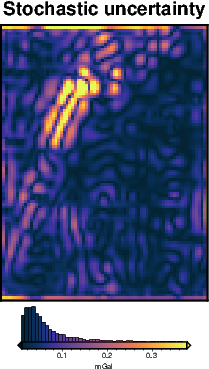

In [51]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
_ = polar_utils.grd_compare(
    grav_grid.gravity_anomaly,
    grav_grid.gravity_anomaly_eqs_mean,
    region=inversion_region,
    plot=True,
    grid1_name="Determinist Equivalent Sources",
    grid2_name="Stochastic Equivalent Sources",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
)
maps.plot_grd(
    grav_grid.eqs_uncert,
    region=inversion_region,
    fig_height=10,
    title="Stochastic uncertainty",
    cmap="thermal",
    hist=True,
    robust=True,
    cbar_label="mGal",
)

In [52]:
# update grav_df and rename columns
grav_df_eqs = grav_df.copy()
grav_df_eqs = grav_df_eqs.rename(
    columns={
        "gravity_anomaly": "gravity_anomaly_deterministic",
        "uncert": "uncert_constant",
    }
)
grav_df_eqs["gravity_anomaly"] = grav_df_eqs.gravity_anomaly_eqs_mean
grav_df_eqs["uncert"] = grav_df_eqs.eqs_uncert

uncert_kwargs["grav_df"]=grav_df_eqs

In [53]:
grav_df_eqs = regional.regional_separation(
    grav_df = grav_df_eqs,
    **regional_grav_kwargs,
)

# kwargs to reuse for all uncertainty analyses
eqs_uncert_kwargs = dict(
    grav_df=grav_df_eqs,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

INFO:invert4geom:using median gravity misfit of constraint points for regional field: -0.27061815559864044 mGal


In [54]:
# save to csv
grav_df_eqs.to_csv("../../results/Ross_Sea_05_grav_df.csv", index=False)

INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_05_uncertainty_eq_sources' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_05_uncertainty_eq_sources'



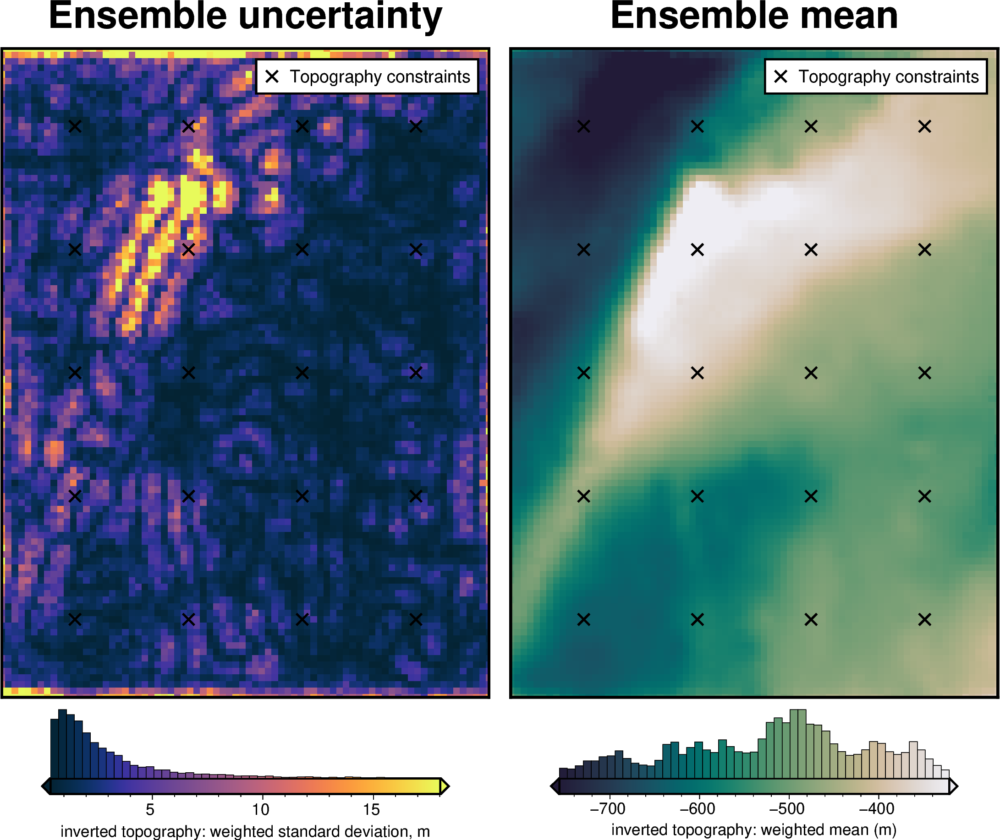

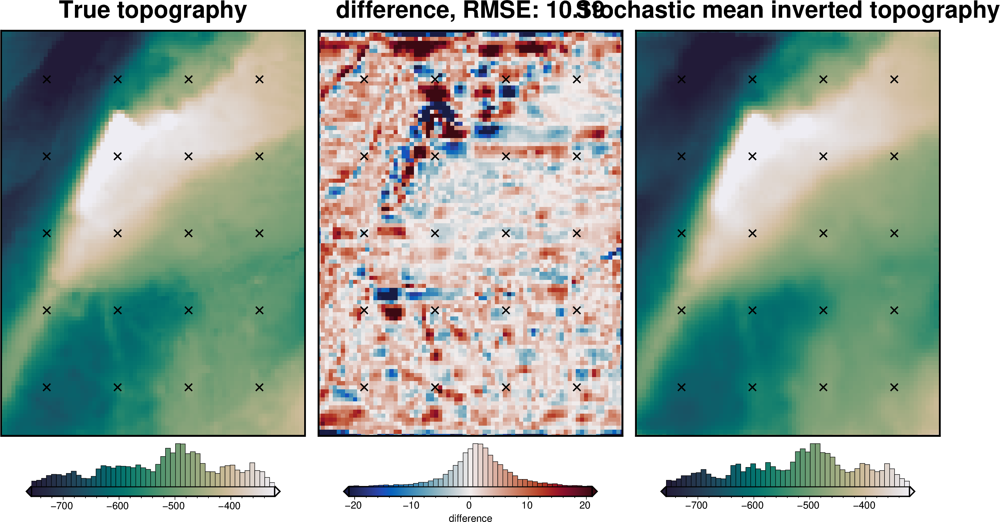

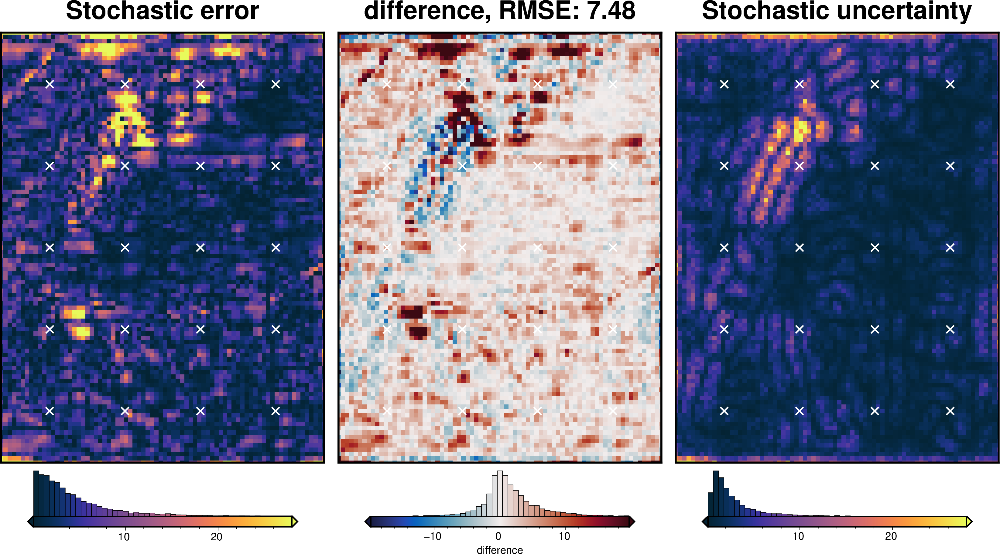

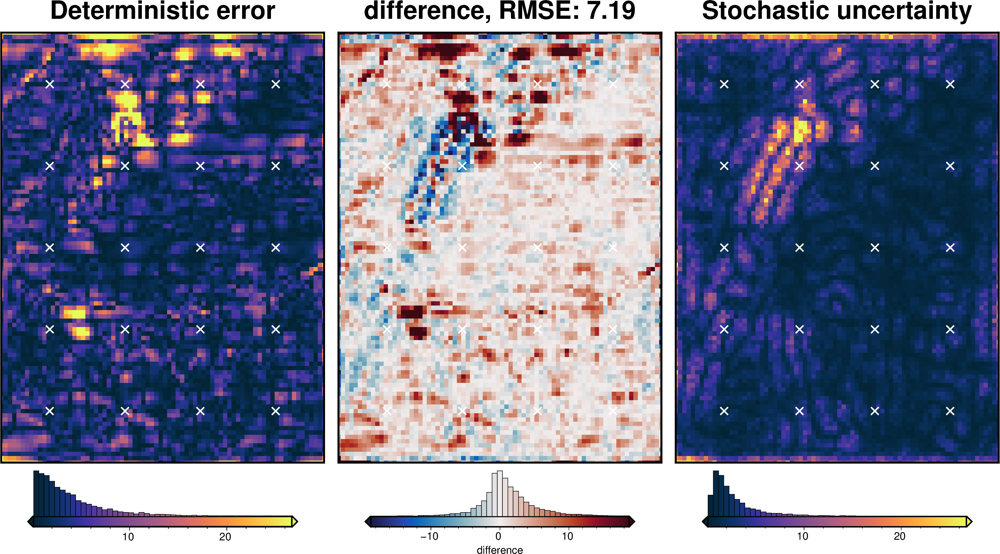

In [55]:
fname = "../../results/Ross_Sea_05_uncertainty_eq_sources"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_eq_sources_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    **eqs_uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_eq_sources_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.013600953795517776, min: 0.007677868878519855, max: 0.022460585786748463
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1459.0000000000002, min: 1419.8007203091988, max: 1498.1992796908012
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_05_uncertainty_full' found, creating new files



stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 20
saving results to pickle files with prefix: '../../results/Ross_Sea_05_uncertainty_full'



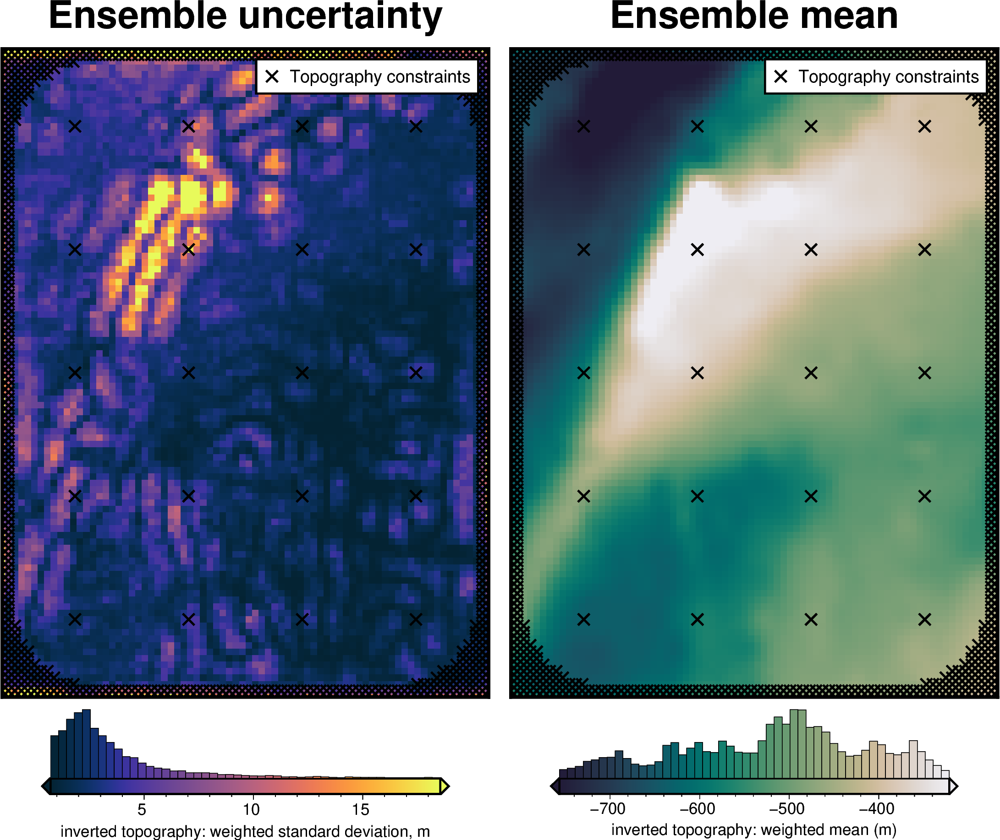

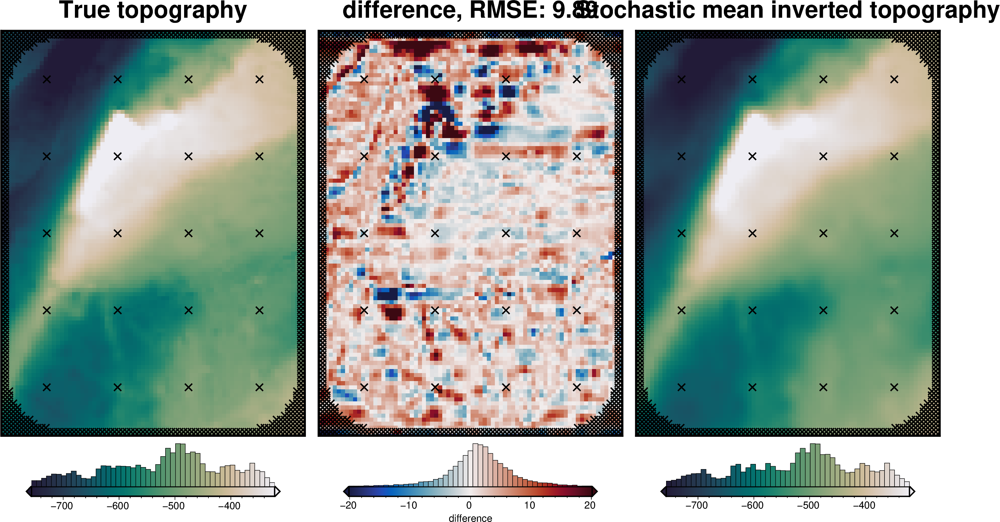

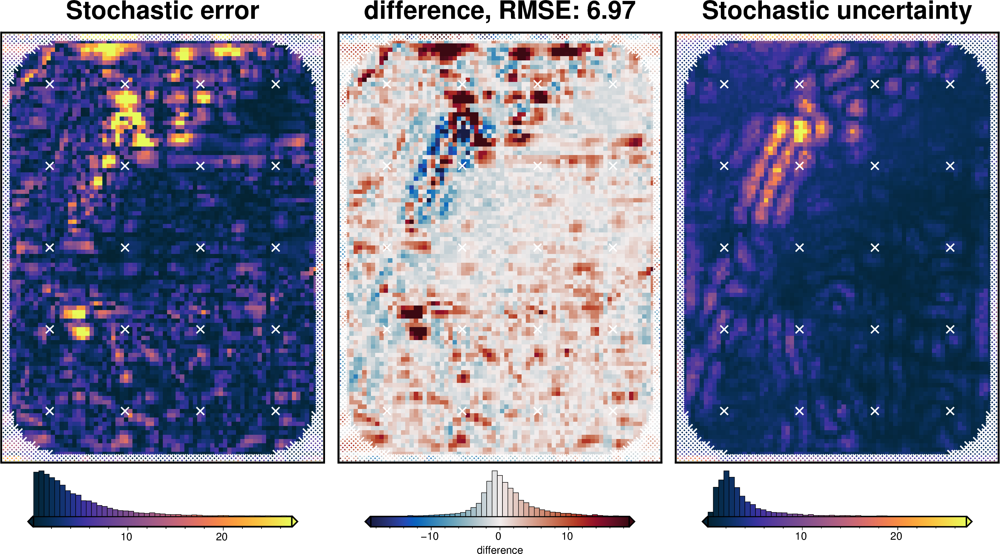

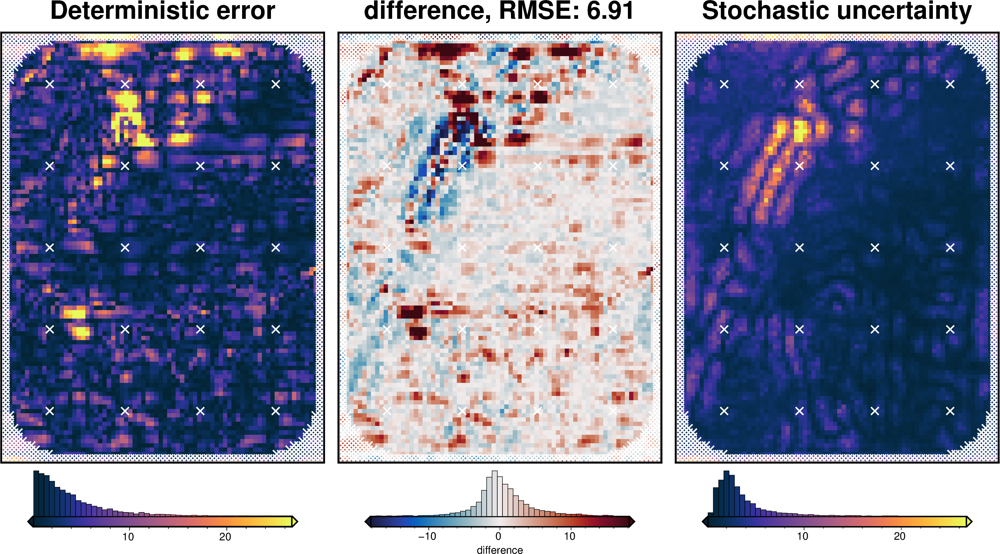

In [56]:
fname = "../../results/Ross_Sea_05_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    sample_gravity=True,
    parameter_dict=solver_dict | density_dict,
    **eqs_uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [64]:
results = [
    uncert_results,
    uncert_eq_sources_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        # region=vd.pad_region(inversion_region, -spacing),
        region=inversion_region,
    )
    stats.append(ds)

In [65]:
names = [
    "full",
    "equivalent source gridding",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 247kB
Dimensions:                           (northing: 101, easting: 76)
Coordinates:
  * northing                          (northing) float64 808B -1.6e+06 ... -1...
  * easting                           (easting) float64 608B -4e+04 ... 1.1e+05
Data variables:
    full_stdev                        (northing, easting) float64 61kB 34.54 ...
    equivalent source gridding_stdev  (northing, easting) float64 61kB 31.64 ...
    density_stdev                     (northing, easting) float64 61kB 0.5573...
    damping_stdev                     (northing, easting) float64 61kB 10.93 ...

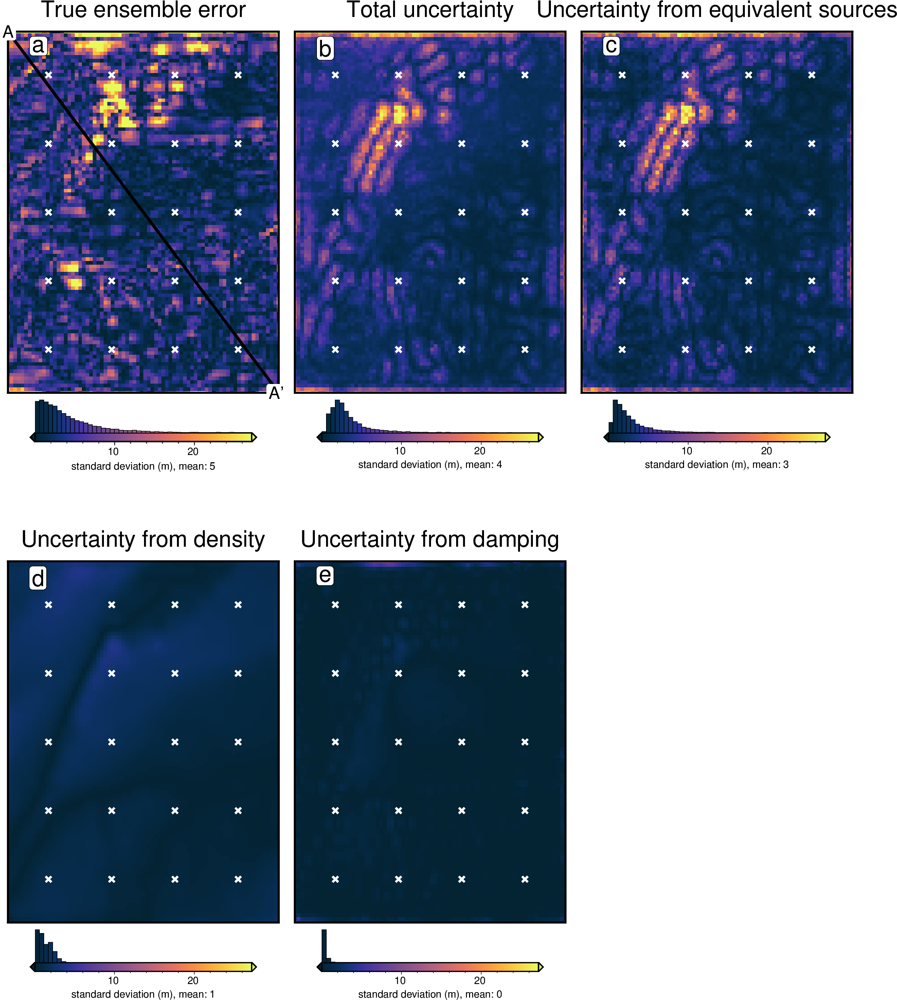

In [66]:
titles = [
    "True ensemble error",
    # "True indiv error",
    "Total uncertainty",
    "Uncertainty from equivalent sources",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

# cpt_lims = polar_utils.get_min_max(grids[0], robust=True,)
cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 3:
        origin_shift = "both_shift"
        xshift_amount = -2
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        # region=vd.pad_region(inversion_region, -3*spacing),
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

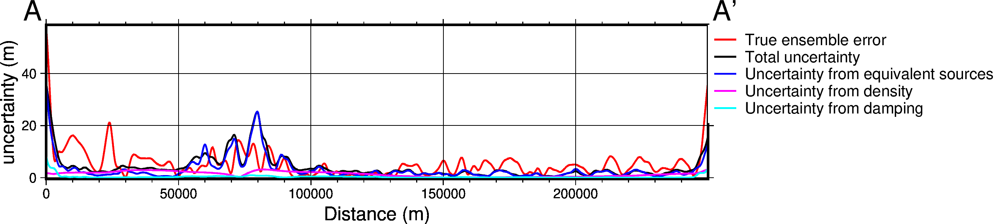

In [67]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

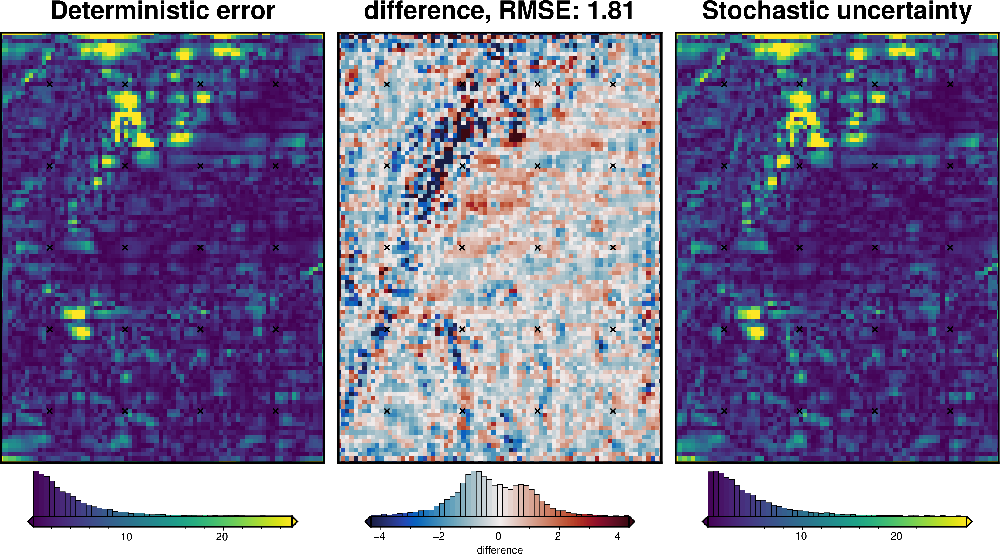

In [68]:
_ = polar_utils.grd_compare(
    inversion_error,
    np.abs(stats[0].weighted_mean - bathymetry),
    region=inversion_region,
    plot=True,
    grid1_name="Deterministic error",
    grid2_name="Stochastic uncertainty",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [69]:
# save results
merged.to_netcdf("../../results/Ross_Sea_05_sensitivity.nc")

In [70]:
stats_ds.to_netcdf("../../results/Ross_Sea_05_uncertainty.nc")